Import libraries and data 

In [25]:
# Importing libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np 
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.pipeline      import Pipeline
from sklearn.compose       import ColumnTransformer, make_column_selector
from sklearn.impute        import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model  import LinearRegression
from sklearn.metrics       import mean_squared_error, r2_score

# Caricare i dati CSV
train = pd.read_csv('data/train.csv')
test = pd.read_csv('data/test.csv')
submission = pd.read_csv('data/submission.csv')
column_desc = pd.read_csv('data/column_descriptions.csv')

# Mostrare le prime righe del dataset di train
train.head()

,Unnamed: 0,id,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed
0,0,261358,Y. Sylla,Youssuf Sylla,ST,58,76,525000.0,952.712115,18,...,43,13,19,17,7,6,8,10,7,NaN
1,1,252435,J. Austerfield,Josh Austerfield,"CM, CDM",55,75,350000.0,902.232819,19,...,48,40,48,45,14,8,5,14,11,NaN
2,2,248723,C. Malley,Connor Malley,"CAM, CM",53,66,230000.0,2873.818374,21,...,52,26,23,31,14,8,13,9,6,NaN
3,3,251157,Lee Gwang Yeon,이광연 Gwang Yeon Lee,GK,60,71,475000.0,678.608124,21,...,26,8,14,12,60,60,54,63,61,23.0
4,4,205393,J. Baldwin,Jack Baldwin,CB,63,65,475000.0,1911.674228,28,...,67,62,63,62,11,12,6,11,14,NaN


Missing values check

In [26]:
# Count missing values for each column and sort them and calculate the percentage of missing values
missing_values = train.isnull().sum().sort_values(ascending=False)
missing_percentage = (missing_values / train.shape[0]) * 100
# print missing values and percentage
print(missing_values[missing_values > 0])
print(missing_percentage[missing_percentage > 0])


nation_jersey_number         14786
nation_position              14786
club_loaned_from             14515
player_tags                  14231
goalkeeping_speed            13662
player_traits                 7936
physic                        1729
defending                     1729
passing                       1729
shooting                      1729
pace                          1729
dribbling                     1729
release_clause_eur             934
club_joined                    925
value_eur                       58
club_name                       49
league_name                     49
league_level                    49
club_position                   49
club_jersey_number              49
wage_eur                        49
club_contract_valid_until       49
club_team_id                    49
dtype: int64
nation_jersey_number         96.069131
nation_position              96.069131
club_loaned_from             94.308362
player_tags                  92.463128
goalkeeping_speed         

Data Distribution analysis:

Identification of numerical and categorical variables and removal of ID variables from numerical

In [27]:
numerical_cols_including_id = train.select_dtypes(include=['int64', 'float64']).columns

id_cols = [
    'Unnamed: 0',        
    'id',                
    'club_team_id',      
    'nationality_id'     
]

numerical_cols = [c for c in numerical_cols_including_id if c not in id_cols]

categorical_cols = train.select_dtypes(include=['object']).columns

print(f"Numerical columns ({len(numerical_cols)}):")
print(numerical_cols, '\n')

print(f"ID columns ({len(id_cols)}):")
print(id_cols, '\n')

print(f"Categorical columns({len(categorical_cols)}):")
print(categorical_cols, '\n')

Numerical columns (56):
['overall', 'potential', 'value_eur', 'wage_eur', 'age', 'height_cm', 'weight_kg', 'league_level', 'club_jersey_number', 'club_contract_valid_until', 'nation_jersey_number', 'weak_foot', 'skill_moves', 'international_reputation', 'release_clause_eur', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking_awareness', 'defending_standing_tackle', 'defending_sliding_tackle', '

Distribution of target value: histogram and boxplot.
Notice it is right skewed.

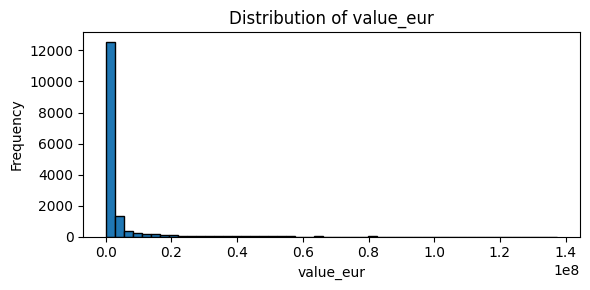

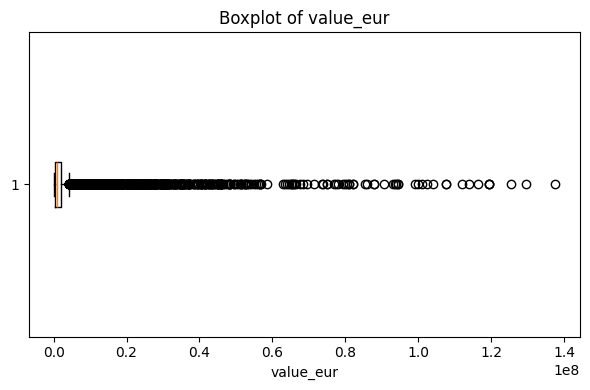

In [28]:
plt.figure(figsize=(6,3))
plt.hist(train['value_eur'].dropna(), bins=50, edgecolor='black')
plt.title(f'Distribution of value_eur')
plt.xlabel('value_eur')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

plt.figure(figsize=(6,4))
plt.boxplot(train['value_eur'].dropna(), vert=False)
plt.title('Boxplot of value_eur')
plt.xlabel('value_eur')
plt.tight_layout()
plt.show()

Distribution of transformed target value: histogram and scatterplot in log(1+x) scale

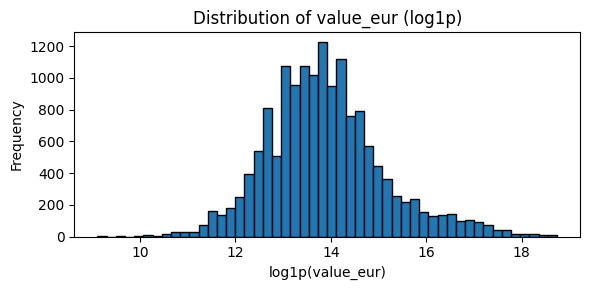

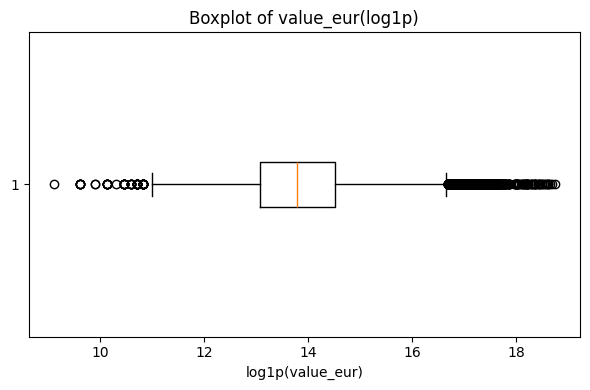

In [29]:
log_target = np.log1p(train['value_eur'].clip(lower=0))

plt.figure(figsize=(6,3))
plt.hist(log_target.dropna(), bins=50, edgecolor='black')
plt.title('Distribution of value_eur (log1p)')
plt.xlabel('log1p(value_eur)')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

plt.figure(figsize=(6,4))
plt.boxplot(log_target.dropna(), vert=False)
plt.title('Boxplot of value_eur(log1p)')
plt.xlabel('log1p(value_eur)')
plt.tight_layout()
plt.show()

Outliers identification and analysis

In [30]:
print(log_target.describe())

# calculate Q1, Q3 e IQR
Q1 = log_target.quantile(0.25)
Q3 = log_target.quantile(0.75)
IQR = Q3 - Q1

# calculate bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# find outliers
mask_outliers = (log_target < lower_bound) | (log_target > upper_bound)
outliers_df = train[mask_outliers]

# result
print(f"Found {outliers_df.shape[0]} outlier:")
#pd.set_option('display.max_rows', None)      # per non troncargli in output
#pd.set_option('display.max_columns', None)   # per mostrare tutte le colonne
print(outliers_df)

count    15333.000000
mean        13.886029
std          1.234259
min          9.105091
25%         13.071072
50%         13.790194
75%         14.508658
max         18.739134
Name: value_eur, dtype: float64
Found 559 outlier:
       Unnamed: 0      id       short_name                          long_name  \
13             13  220253            Munir           Munir El Haddadi Mohamed   
20             20  240950  Pedro Gonçalves    Pedro António Pereira Gonçalves   
47             47  153079        S. Agüero  Sergio Leonel Agüero del Castillo   
57             57  210406     P. Zieliński          Piotr Sebastian Zieliński   
84             84  230225   Juiano Mestres   Juan Everton Mestres de Mesquita   
...           ...     ...              ...                                ...   
15286       15286  240900       Unai Núñez                 Unai Núñez Gestoso   
15330       15330  199914            Allan             Allan Marques Loureiro   
15365       15365  255618        Gao Xiang  

Numerical data distribution analysis: hist, boxplot and scatterplot vs target value and scatterplot vs log1 target value

In [31]:
train.corr(numeric_only=True)['value_eur'].sort_values(ascending=False)
train.corr(numeric_only=True).style.background_gradient(cmap='coolwarm', axis=None, low=0.3, high=0.7)

,Unnamed: 0,id,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_team_id,league_level,club_jersey_number,club_contract_valid_until,nationality_id,nation_jersey_number,weak_foot,skill_moves,international_reputation,release_clause_eur,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed
Unnamed: 0,1.000000,0.009716,-0.006713,-0.000228,-0.002039,-0.001299,-0.006846,0.003367,0.003925,0.004075,-0.012971,0.000678,0.002674,0.003255,0.000806,-0.009232,-0.010422,-0.005731,-0.003547,-0.003228,-0.007719,-0.008977,-0.010122,-0.008440,-0.011733,-0.011072,-0.011142,-0.006994,-0.012970,-0.010544,-0.013822,-0.007441,-0.015129,-0.007671,-0.009532,-0.005934,-0.004021,-0.011809,-0.004626,-0.003551,-0.003839,-0.009528,-0.008461,-0.009471,-0.010666,-0.009390,-0.008308,-0.010759,-0.007306,-0.005503,-0.005793,-0.012086,-0.011395,-0.009429,0.010336,0.011596,0.010287,0.007808,0.010528,0.041206
id,0.009716,1.000000,-0.492398,0.037609,-0.129469,-0.254962,-0.782727,-0.099372,-0.207076,0.106471,-0.040164,0.186806,0.131714,0.062758,0.159730,-0.122037,-0.143266,-0.335895,-0.115499,0.159031,-0.306605,-0.412034,-0.299378,-0.229100,-0.403906,-0.167642,-0.130250,-0.148962,-0.181719,-0.199469,-0.087044,-0.212763,-0.229861,-0.225834,-0.142521,0.100523,0.097011,-0.063831,-0.484725,0.016039,-0.330204,-0.224192,-0.117992,-0.304036,-0.205574,-0.243140,-0.170483,-0.137516,-0.266781,-0.183107,-0.423899,-0.158299,-0.089466,-0.073360,-0.104040,-0.108303,-0.105167,-0.114196,-0.104641,-0.418199
overall,-0.006713,-0.492398,1.000000,0.644563,0.558455,0.601583,0.457797,0.043545,0.152168,-0.232774,-0.178155,-0.183854,0.182206,-0.171317,-0.086759,0.228594,0.378988,0.471784,0.547884,0.174876,0.491735,0.714130,0.666999,0.343537,0.527859,0.399545,0.341871,0.343798,0.516715,0.384026,0.385826,0.420219,0.381349,0.498655,0.460857,0.194631,0.207701,0.271676,0.871814,0.122274,0.562278,0.280755,0.386812,0.364214,0.411573,0.400208,0.314186,0.359516,0.522923,0.347927,0.711693,0.311097,0.257464,0.231498,-0.014417,-0.013419,-0.015526,-0.004963,-0.010123,0.498404
potential,-0.000228,0.037609,0.644563,1.000000,0.528645,0.495030,-0.265844,0.009568,-0.014012,-0.339996,-0.152647,0.013804,0.344170,-0.251066,-0.014176,0.160496,0.283336,0.354458,0.537287,0.257104,0.287051,0.438940,0.489211,0.164298,0.156766,0.240447,0.229488,0.191370,0.367358,0.234722,0.309181,0.268448,0.207865,0.326465,0.345748,0.229409,0.232937,0.220197,0.522369,0.133539,0.330223,0.092297,0.199484,0.074535,0.242246,0.192319,0.158769,0.230723,0.342617,0.209185,0.425927,0.161941,0.156961,0.141470,-0.042631,-0.044603,-0.046416,-0.039288,-0.040572,0.221804
value_eur,-0.002039,-0.129469,0.558455,0.528645,1.000000,0.823054,0.044749,0.015614,0.042930,-0.196912,-0.119184,-0.066140,0.219717,-0.084814,0.008333,0.155153,0.254593,0.632083,0.995313,0.179379,0.292227,0.406285,0.405900,0.152930,0.221984,0.224493,0.217959,0.169713,0.299035,0.239990,0.241493,0.251268,0.215568,0.280389,0.270058,0.154698,0.164679,0.174098,0.497302,0.114095,0.306210,0.118844,0.200997,0.134242,0.231810,0.187551,0.144018,0.224126,0.324678,0.198691,0.392885,0.147109,0.123771,0.106364,-0.023647,-0.022864,-0.022064,-0.022796,-0.020494,0.197127
wage_eur,-0.001299,-0.254962,0.601583,0.495030,0.823054,1.000000,0.160166,0.032659,0.072148,-0.242462,-0.126736,-0.066087,0.186322,-0.092352

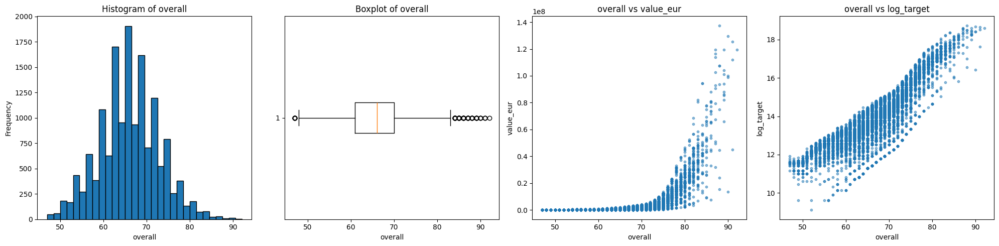

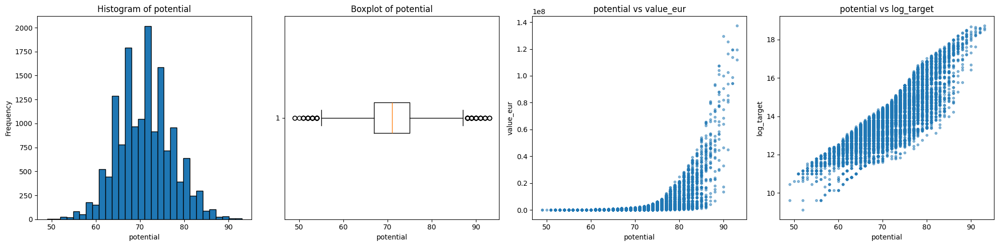

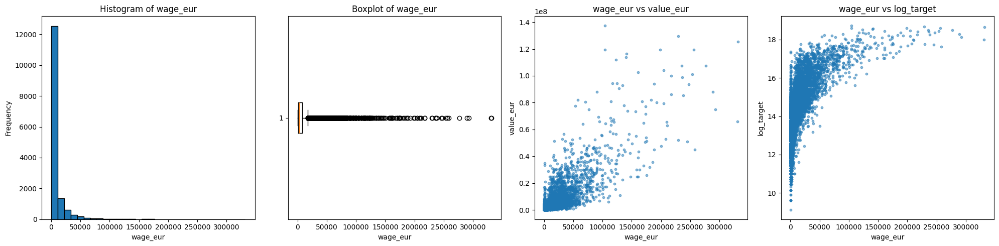

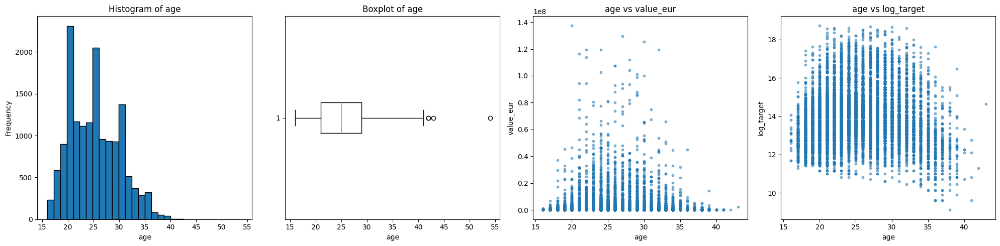

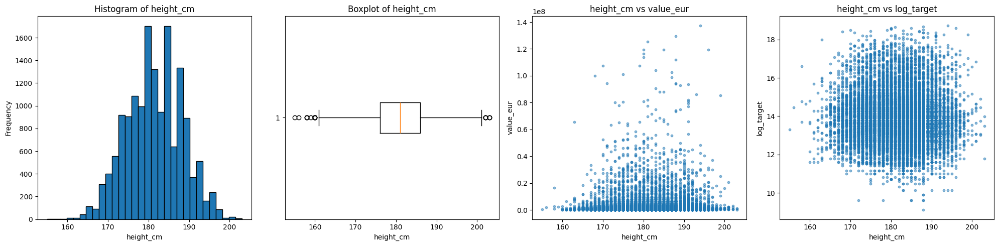

...

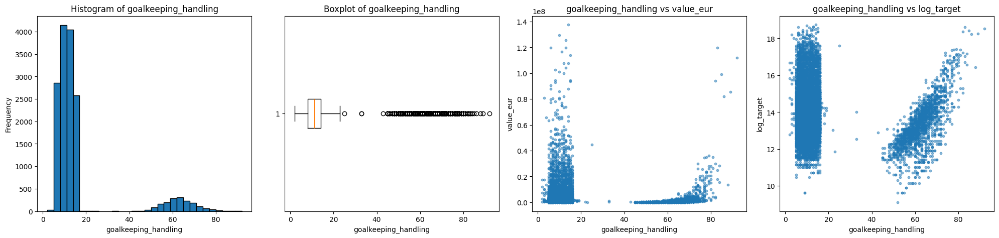

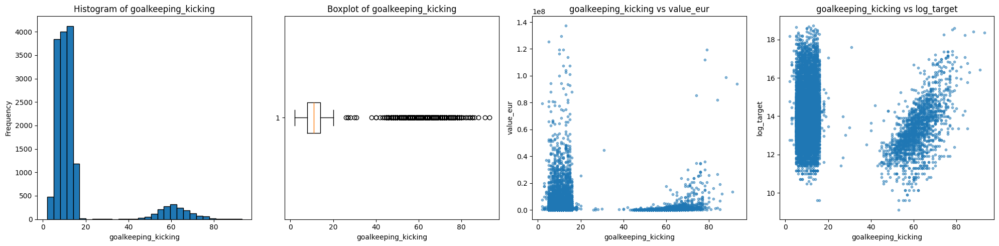

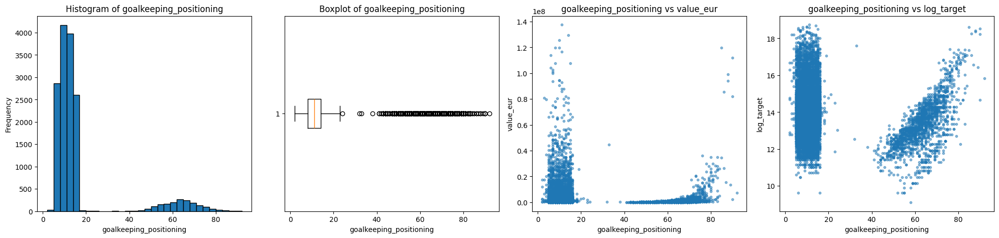

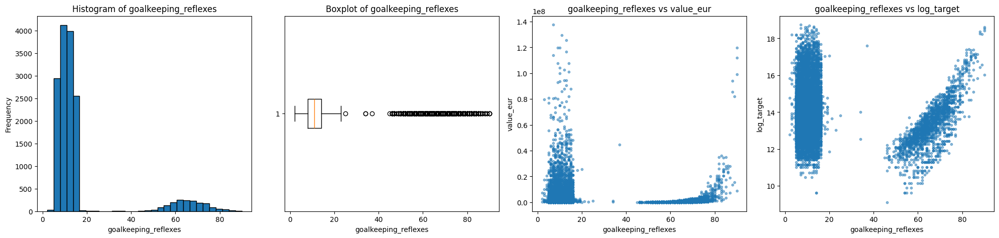

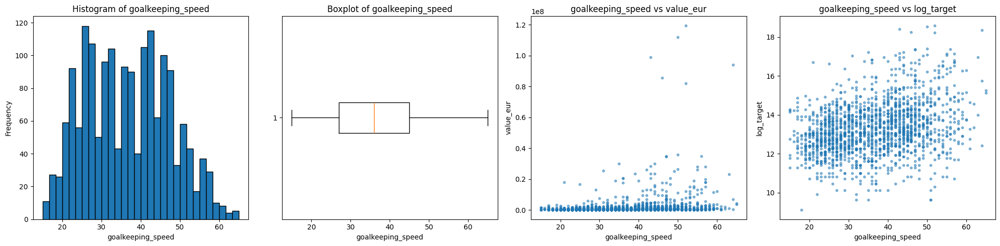

In [32]:
import matplotlib.pyplot as plt

target = 'value_eur'

for col in numerical_cols:
    if col == target:
        continue

    # create figure with 1 row and 3 cols
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    # 1) Histogram
    axes[0].hist(train[col].dropna(), bins=30, edgecolor='black')
    axes[0].set_title(f'Histogram of {col}')
    axes[0].set_xlabel(col)
    axes[0].set_ylabel('Frequency')

    # 2) Boxplot
    axes[1].boxplot(train[col].dropna(), vert=False)
    axes[1].set_title(f'Boxplot of {col}')
    axes[1].set_xlabel(col)

    # 3) Scatter vs target
    axes[2].scatter(train[col], train[target], alpha=0.5, s=10)
    axes[2].set_title(f'{col} vs {target}')
    axes[2].set_xlabel(col)
    axes[2].set_ylabel(target)

    # 4) Scatter vs log1(target)
    axes[3].scatter(train[col], log_target, alpha=0.5, s=10)
    axes[3].set_title(f'{col} vs log_target')
    axes[3].set_xlabel(col)
    axes[3].set_ylabel('log_target')

    plt.tight_layout()
    plt.show()


Categorical data distribution analysis: hist, boxplot and scatterplot vs target value and scatterplot vs log1 target value

['player_positions', 'dob', 'club_name', 'league_name', 'club_position', 'club_loaned_from', 'club_joined', 'nationality_name', 'nation_position', 'preferred_foot', 'work_rate', 'body_type', 'player_tags', 'player_traits']

=== Colonna: player_positions ===
                  count  rel_freq (%)
player_positions                     
CB                 1967     12.780196
GK                 1729     11.233838
ST                 1441      9.362615
CDM, CM             756      4.911962
CM                  575      3.735950
CM, CDM             540      3.508544
LB                  483      3.138198
RB                  480      3.118706
CB, RB              241      1.565850
CDM                 237      1.539861
CAM, CM             194      1.260477
CB, LB              181      1.176012
CAM                 176      1.143525
CM, CAM             165      1.072055
RM, LM              164      1.065558
LB, LM              164      1.065558
CB, CDM             161      1.046066
LM                  

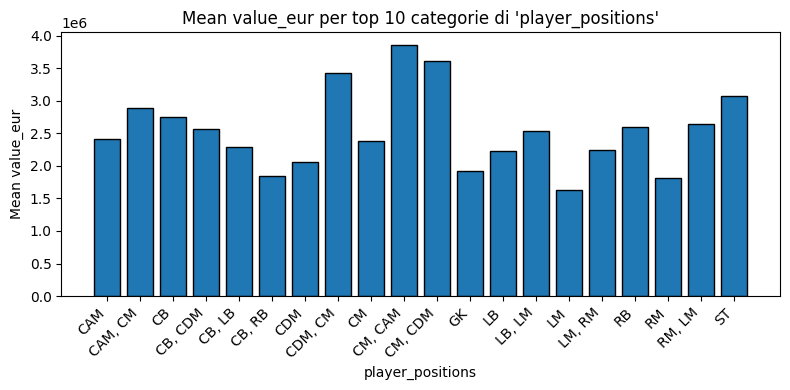


=== Colonna: dob ===
            count  rel_freq (%)
dob                            
1996-02-29     99      0.643233
1992-02-29     99      0.643233
2000-02-29     73      0.474303
1988-02-29     30      0.194919
1993-03-05     11      0.071470
2000-01-14     11      0.071470
1999-02-25     11      0.071470
2000-08-02     10      0.064973
1997-05-23     10      0.064973
1999-03-22     10      0.064973
1999-03-05     10      0.064973
2000-02-22      9      0.058476
1996-11-11      9      0.058476
1997-02-27      9      0.058476
1997-03-18      9      0.058476
1993-09-01      9      0.058476
2000-01-06      9      0.058476
2000-05-18      9      0.058476
1994-09-08      9      0.058476
1996-06-28      9      0.058476


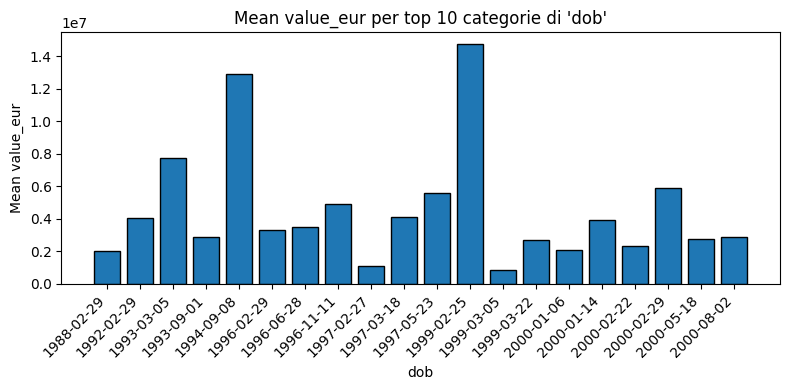


=== Colonna: club_name ===
                         count  rel_freq (%)
club_name                                   
Manchester City             31      0.202060
Leicester City              30      0.195542
ESTAC Troyes                30      0.195542
Crystal Palace              30      0.195542
Southampton                 29      0.189024
Athletic Club de Bilbao     29      0.189024
Tottenham Hotspur           29      0.189024
Chelsea                     29      0.189024
Everton                     29      0.189024
Brentford                   29      0.189024
RCD Mallorca                29      0.189024
Valencia CF                 29      0.189024
Venezia FC                  29      0.189024
Manchester United           28      0.182506
Roma                        28      0.182506
LOSC Lille                  28      0.182506
Levante Unión Deportiva     28      0.182506
Pohang Steelers             28      0.182506
Amiens SC                   28      0.182506
CA Osasuna                 

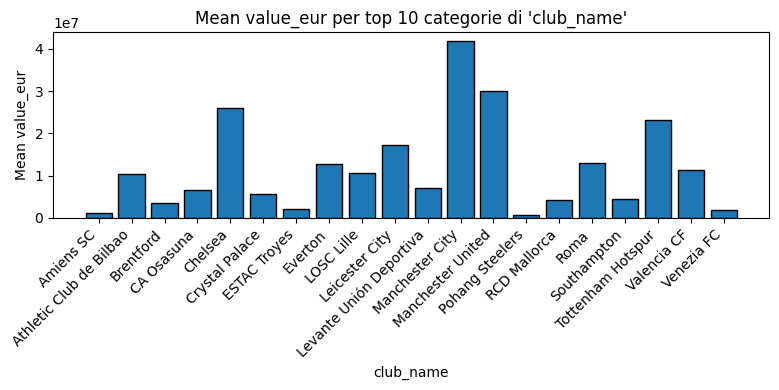


=== Colonna: league_name ===
                               count  rel_freq (%)
league_name                                       
USA Major League Soccer          616      4.015122
Argentina Primera División       595      3.878243
English League Championship      559      3.643593
English Premier League           535      3.487159
Spain Primera Division           520      3.389389
English League One               512      3.337244
Spanish Segunda División         490      3.193847
English League Two               482      3.141703
French Ligue 1                   473      3.083040
Italian Serie A                  466      3.037414
Japanese J. League Division 1    459      2.991787
Turkish Süper Lig                441      2.874462
German 3. Bundesliga             428      2.789728
French Ligue 2                   423      2.757137
German 1. Bundesliga             419      2.731065
German 2. Bundesliga             411      2.678921
Portuguese Liga ZON SAGRES       403      2.626776
P

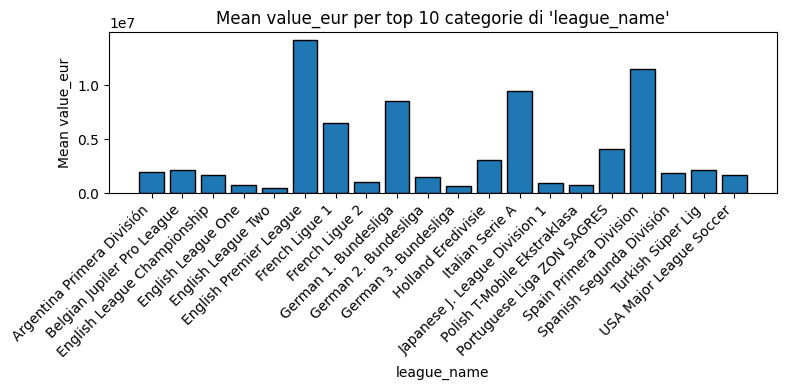


=== Colonna: club_position ===
               count  rel_freq (%)
club_position                     
SUB             6637     43.260331
RES             2536     16.529788
LCB              576      3.754400
RCB              570      3.715291
GK               563      3.669665
RB               410      2.672403
LB               395      2.574632
ST               384      2.502933
RCM              370      2.411680
LCM              367      2.392126
RM               329      2.144440
LM               323      2.105332
CAM              232      1.512189
LS               192      1.251467
RS               188      1.225394
RDM              178      1.160214
LDM              175      1.140660
LW               156      1.016817
CB               147      0.958154
RW               136      0.886455


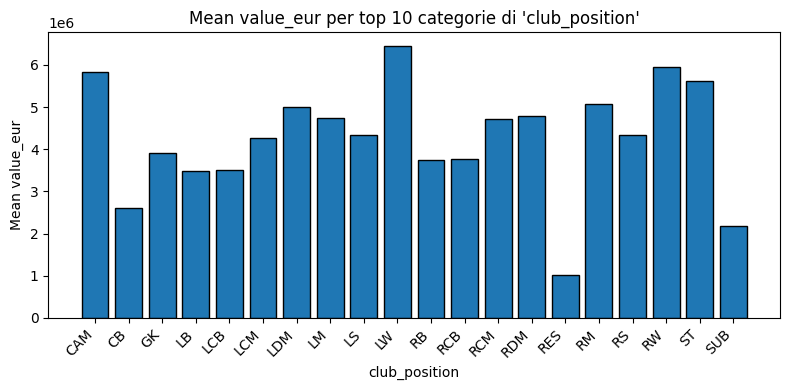


=== Colonna: club_loaned_from ===
                         count  rel_freq (%)
club_loaned_from                            
Atlético de Madrid          12      1.369863
Sporting CP                 12      1.369863
Manchester United           11      1.255708
SL Benfica                  11      1.255708
Atalanta                    11      1.255708
Watford                     10      1.141553
Aston Villa                 10      1.141553
Manchester City             10      1.141553
Inter                       10      1.141553
Chelsea                     10      1.141553
Brighton & Hove Albion       9      1.027397
Juventus                     9      1.027397
Liverpool                    9      1.027397
Wolverhampton Wanderers      9      1.027397
Estudiantes de La Plata      9      1.027397
RB Leipzig                   9      1.027397
SV Werder Bremen             8      0.913242
Stoke City                   8      0.913242
Norwich City                 8      0.913242
FC Metz             

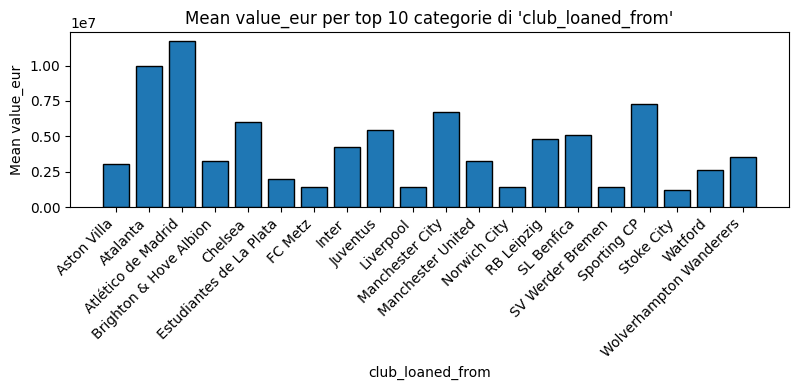


=== Colonna: club_joined ===
             count  rel_freq (%)
club_joined                     
2021-07-01    1020      7.051016
2019-07-01     668      4.617724
2018-07-01     366      2.530071
2020-07-01     329      2.274298
2017-07-01     232      1.603761
2020-01-01     222      1.534633
2021-01-01     217      1.500069
2019-01-01     181      1.251210
2021-07-08     163      1.126780
2021-08-31     148      1.023089
2016-07-01     146      1.009263
2021-07-07     140      0.967787
2021-02-01     109      0.753491
2018-01-01     108      0.746578
2020-08-01      98      0.677451
2020-10-05      92      0.635974
2015-07-01      90      0.622148
2021-07-02      84      0.580672
2021-01-09      79      0.546108
2021-07-05      79      0.546108


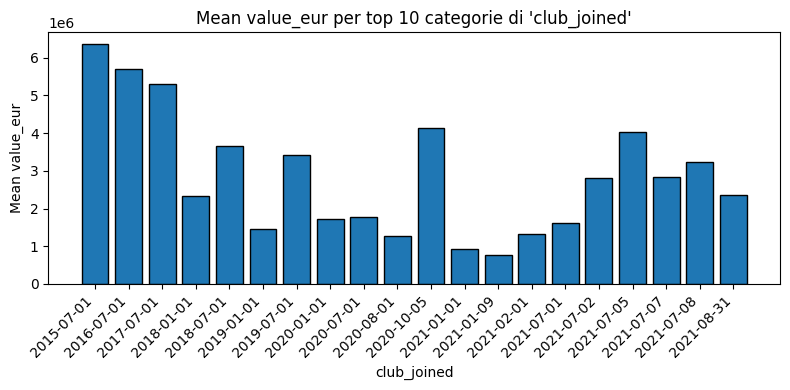


=== Colonna: nationality_name ===
                     count  rel_freq (%)
nationality_name                        
England               1383      8.985771
Germany                953      6.191930
Spain                  874      5.678643
France                 790      5.132870
Argentina              785      5.100383
Brazil                 717      4.658567
Japan                  430      2.793841
Netherlands            346      2.248067
United States          328      2.131116
Poland                 325      2.111624
China PR               311      2.020661
Sweden                 310      2.014164
Norway                 308      2.001170
Portugal               299      1.942694
Saudi Arabia           297      1.929699
Republic of Ireland    289      1.877721
Mexico                 279      1.812748
Italy                  277      1.799753
Romania                275      1.786758
Korea Republic         265      1.721785


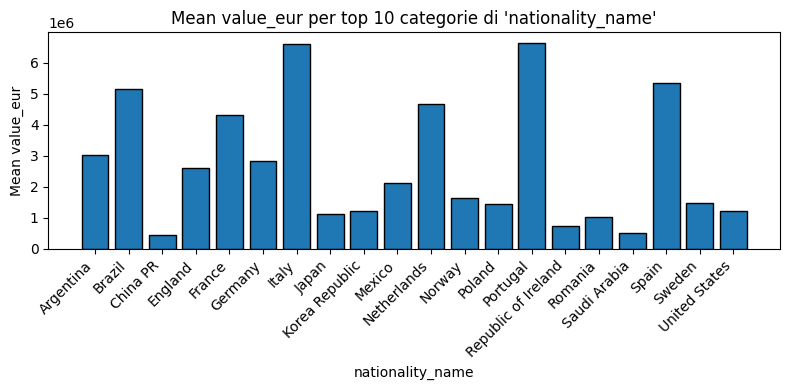


=== Colonna: nation_position ===
                 count  rel_freq (%)
nation_position                     
SUB                324     53.553719
LCB                 28      4.628099
RCB                 26      4.297521
GK                  23      3.801653
ST                  22      3.636364
RB                  20      3.305785
LCM                 20      3.305785
RCM                 19      3.140496
LB                  17      2.809917
RW                  13      2.148760
CDM                 12      1.983471
LM                  11      1.818182
LW                  11      1.818182
CAM                 10      1.652893
RM                   9      1.487603
LDM                  8      1.322314
LS                   7      1.157025
RDM                  7      1.157025
CB                   5      0.826446
RS                   4      0.661157


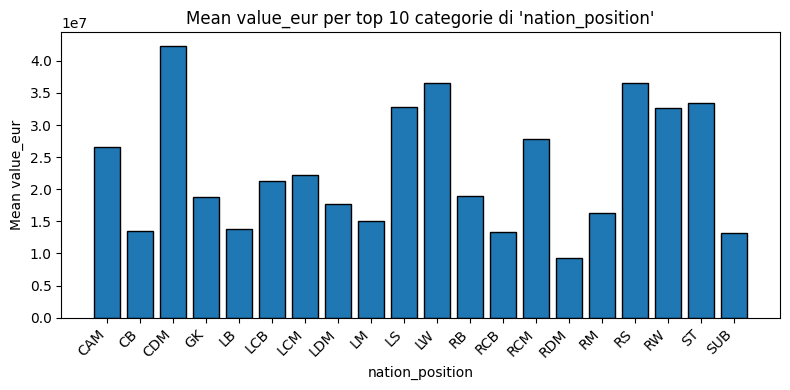


=== Colonna: preferred_foot ===
                count  rel_freq (%)
preferred_foot                     
Right           11749      76.33682
Left             3642      23.66318


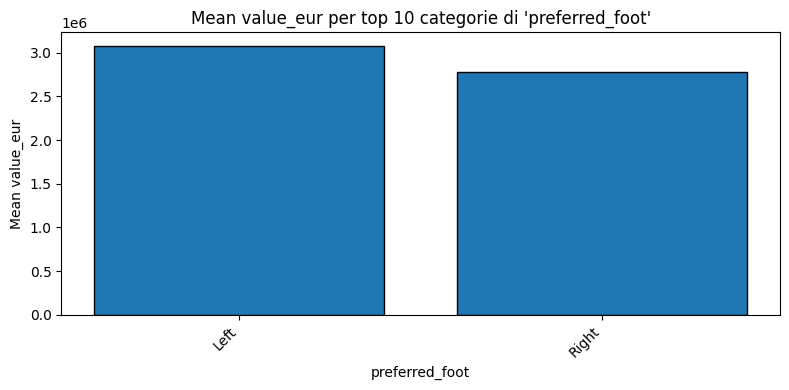


=== Colonna: work_rate ===
               count  rel_freq (%)
work_rate                         
Medium/Medium   8044     52.264310
High/Medium     2934     19.063089
Medium/High     1482      9.629004
High/High        872      5.665649
Medium/Low       646      4.197258
High/Low         629      4.086804
Low/Medium       387      2.514457
Low/High         358      2.326035
Low/Low           39      0.253395


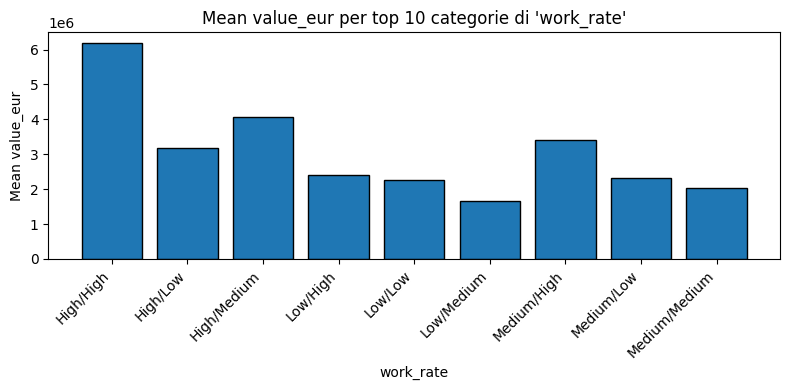


=== Colonna: body_type ===
                  count  rel_freq (%)
body_type                            
Normal (170-185)   5385     34.987980
Normal (185+)      3377     21.941394
Lean (170-185)     3247     21.096745
Lean (185+)        1565     10.168280
Normal (170-)       533      3.463063
Stocky (170-185)    428      2.780846
Lean (170-)         375      2.436489
Stocky (185+)       296      1.923202
Unique              112      0.727698
Stocky (170-)        73      0.474303


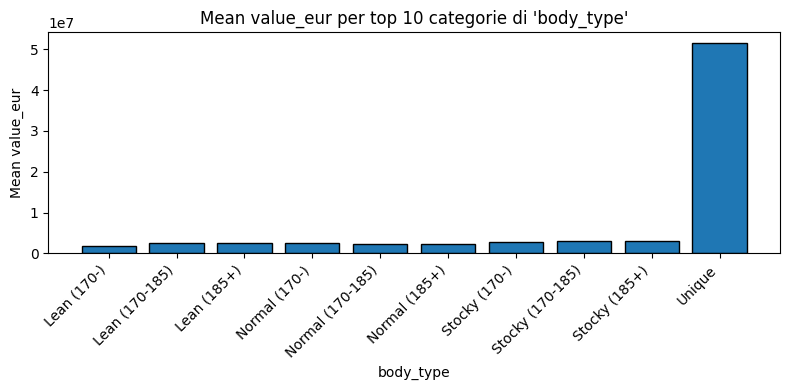


=== Colonna: player_tags ===
                                 count  rel_freq (%)
player_tags                                         
#Strength                          412     35.517241
#Acrobat                           181     15.603448
#Engine                            160     13.793103
#Speedster                         114      9.827586
#Aerial Threat, #Strength           52      4.482759
#Speedster, #Acrobat                42      3.620690
#Dribbler                           24      2.068966
#Aerial Threat                      24      2.068966
#Dribbler, #Acrobat                 14      1.206897
#Speedster, #Dribbler, #Acrobat     13      1.120690
#Tactician                          12      1.034483
#Crosser                             9      0.775862
#Engine, #Acrobat                    9      0.775862
#Playmaker                           7      0.603448
#FK Specialist                       7      0.603448
#Tackling, #Tactician                7      0.603448
#Speedster, #Eng

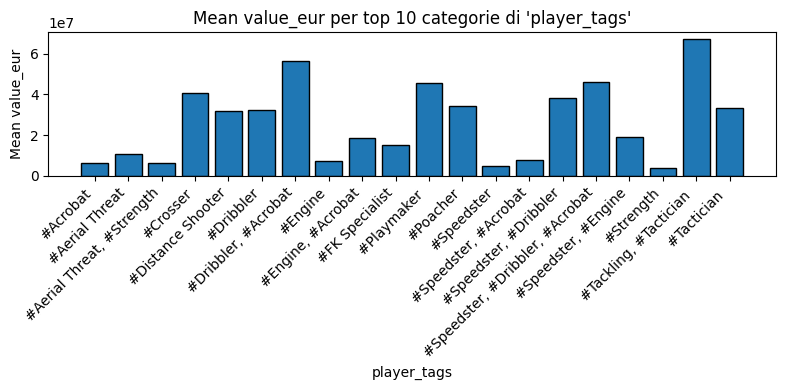


=== Colonna: player_traits ===
                                count  rel_freq (%)
player_traits                                      
Speed Dribbler (AI)               549      7.364185
Injury Prone                      356      4.775319
Technical Dribbler (AI)           333      4.466801
Power Header                      292      3.916834
Dives Into Tackles (AI)           289      3.876593
Long Passer (AI)                  266      3.568075
Long Shot Taker (AI)              260      3.487592
Flair, Technical Dribbler (AI)    182      2.441315
Team Player                       178      2.387659
Early Crosser                     173      2.320590
Long Throw-in                     149      1.998659
Solid Player                      137      1.837693
Playmaker (AI)                    130      1.743796
Leadership                        129      1.730382
Flair                             128      1.716968
Finesse Shot                      108      1.448692
Comes For Crosses               

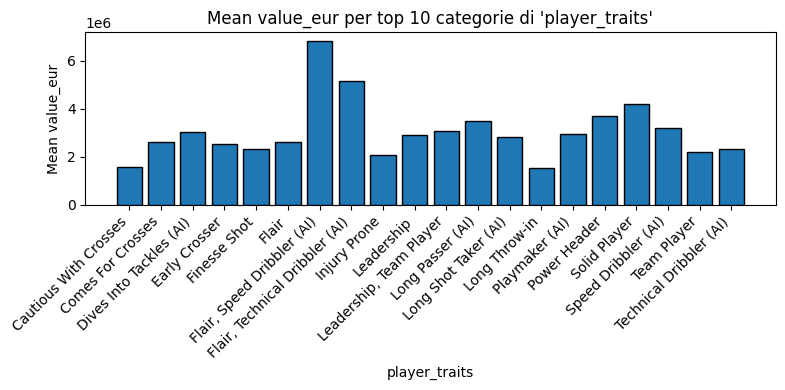

In [33]:
categorical_cols_including_names = train.select_dtypes(include=['object']).columns

names_cols = [
    'short_name',        
    'long_name'     
]

categorical_cols = [c for c in categorical_cols_including_names if c not in names_cols]

print(categorical_cols)
for col in categorical_cols:
    # 1) Trova le top 10 categorie per frequenza
    freq = train[col].value_counts()
    rel_freq = train[col].value_counts(normalize=True)  # frequenza relativa (frazione)
    
    top20 = freq.head(20).index.tolist()

    # 2) Costruisci un DataFrame con count e relative_freq
    df_freq = pd.DataFrame({
        'count':        freq.loc[top20],
        'rel_freq (%)': rel_freq.loc[top20] * 100
    })
    print(f"\n=== Colonna: {col} ===")
    print(df_freq)

    # 3) Calcola la media del target per queste categorie
    mean_target = train.loc[train[col].isin(top20)].groupby(col)[target].mean()

    # 3) Bar plot delle medie
    plt.figure(figsize=(8,4))
    plt.bar(mean_target.index.astype(str), mean_target.values, edgecolor='black')
    plt.title(f"Mean {target} per top 10 categorie di '{col}'")
    plt.xlabel(col)
    plt.ylabel(f"Mean {target}")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()



Baseline (naive approach) with OLS 80% 20% 

In [34]:
# 1) Load and drop rows with missing target
df = pd.read_csv('data/train.csv')
df = df.dropna(subset=['value_eur'])

# 2) Split into X / y
y = df.pop('value_eur')
X = df

# 3) Train/validation split
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# 4) Minimal preprocessing
preprocessor = ColumnTransformer([
    # numeric: median‐impute + scale
    ('num',
       Pipeline([
           ('imputer', SimpleImputer(strategy='median')),
           ('scaler',   StandardScaler())
       ]),
       make_column_selector(dtype_include=np.number)
    ),
    # categorical: constant‐impute + one‐hot
    ('cat',
       Pipeline([
           ('imputer', SimpleImputer(strategy='constant', fill_value='MISSING')),
           ('onehot',  OneHotEncoder(handle_unknown='ignore',
                                     sparse_output=False))
       ]),
       make_column_selector(dtype_exclude=np.number)
    )
],
    remainder='drop'  # drop anything else
)

# 5) Full pipeline with OLS baseline
pipeline = Pipeline([
    ('preprocess', preprocessor),
    ('model',      LinearRegression())
])

# 6) Fit on the training fold
pipeline.fit(X_train, y_train)

# 7) Evaluate on the validation fold
y_pred = pipeline.predict(X_val)
rmse = np.sqrt(mean_squared_error(y_val, y_pred))
r2   = r2_score(y_val, y_pred)

print(f"Validation RMSE: {rmse:.2f}")
print(f"Validation R²:   {r2:.3f}")


Validation RMSE: 1366579.29
Validation R²:   0.964


Baseline (naive approach) with OLS cross validation

In [35]:
# 1) Load and drop rows with missing target
df = pd.read_csv('data/train.csv')
df = df.dropna(subset=['value_eur'])

# 2) Split into X / y
y = df.pop('value_eur')
X = df

# 3) Preprocessing pipeline
preprocessor = ColumnTransformer([
    ('num',
     Pipeline([
         ('imputer', SimpleImputer(strategy='median')),
         ('scaler', StandardScaler())
     ]),
     make_column_selector(dtype_include=np.number)
    ),
    ('cat',
     Pipeline([
         ('imputer', SimpleImputer(strategy='constant', fill_value='MISSING')),
         ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
     ]),
     make_column_selector(dtype_exclude=np.number)
    )
], remainder='drop')

# 4) Full pipeline with linear regression
pipeline = Pipeline([
    ('preprocess', preprocessor),
    ('model', LinearRegression())
])

# 5) Define shuffled KFold cross-validator
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# 6) Cross-validation with the shuffled splits
neg_mse_scores = cross_val_score(pipeline, X, y, scoring='neg_root_mean_squared_error', cv=cv)
r2_scores = cross_val_score(pipeline, X, y, scoring='r2', cv=cv)

# Convert negative RMSE scores to positive
rmse_scores = -neg_mse_scores

# 7) Report average and std
print(f"Cross-validated RMSE: {rmse_scores.mean():.2f} ± {rmse_scores.std():.2f}")
print(f"Cross-validated R²:   {r2_scores.mean():.3f} ± {r2_scores.std():.3f}")

Cross-validated RMSE: 1404929.47 ± 152278.32
Cross-validated R²:   0.965 ± 0.007
